<a href="https://colab.research.google.com/github/satyahi0729/BackPack/blob/master/Copy_of_p_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import tensorflow as tf
import tensorflow_hub as hub
print('TensorFlow version: ', tf.__version__)
print('TensorFlow Hub version: ', hub.__version__)

TensorFlow version:  2.12.0
TensorFlow Hub version:  0.14.0


In [ ]:
# Models: https://tfhub.dev/tensorflow/collections/object_detection/1
model_paths = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

In [ ]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3984, done.
remote: Counting objects: 100% (3984/3984), done.
remote: Compressing objects: 100% (3092/3092), done.
remote: Total 3984 (delta 1150), reused 1953 (delta 835), pack-reused 0
Receiving objects: 100% (3984/3984), 49.75 MiB | 27.41 MiB/s, done.
Resolving deltas: 100% (1150/1150), done.


In [ ]:
%%bash
# https://linuxcommandlibrary.com/man/protoc
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 16 not upgraded.
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 53.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.6/28.6 MB 25.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.4/269.4 kB 17.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing met



ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
filelock 3.12.3 requires typing-extensions>=4.7.1; python_version < "3.11", but you have typing-extensions 4.5.0 which is incompatible.
flax 0.6.4 requires PyYAML>=5.4.1, but you have pyyaml 5.3.1 which is incompatible.
orbax-checkpoint 0.3.5 requires jax>=0.4.9, but you have jax 0.3.25 which is incompatible.
pydantic 2.3.0 requires typing-extensions>=4.6.1, but you have typing-extensions 4.5.0 which is incompatible.
pydantic-core 2.6.3 requires typing-extensions!=4.7.0,>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.


In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils
from object_detection.utils import ops

In [ ]:
path_to_labels = '/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
classes_indices = label_map_util.create_category_index_from_labelmap(path_to_labels, use_display_name = True)

In [ ]:
classes_indices

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [ ]:
model_name = 'CenterNet HourGlass104 Keypoints 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']

In [ ]:
model_path = model_paths[model_name]

In [ ]:
print('Model: ', model_name)
print('Model path:', model_path)

Model:  CenterNet HourGlass104 Keypoints 512x512
Model path: https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1


In [ ]:
model = hub.load(model_path)

In [ ]:
image = Image.open('/content/tokyo city.jpg')

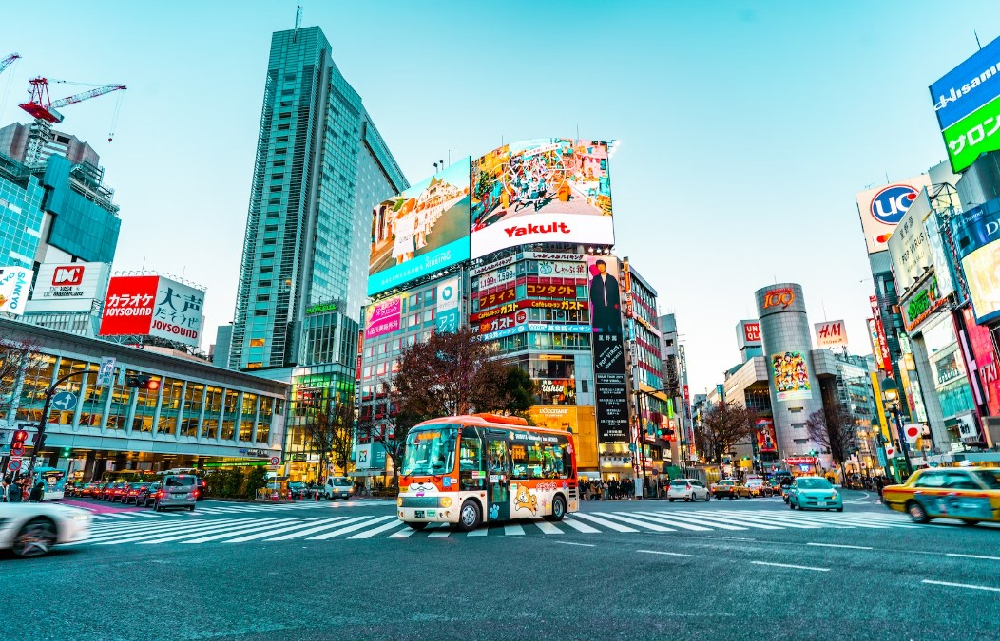

In [ ]:
image

In [ ]:
image.size

(1052, 675)

In [ ]:
type(image)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
(width, height) = image.size
print(width, height)

1052 675


In [ ]:
image = np.array(image.getdata()).reshape((1, height, width, 3)).astype(np.uint8)
image.shape

(1, 675, 1052, 3)

In [ ]:
type(image)

numpy.ndarray

In [ ]:
image

array([[[[168, 236, 249],
         [168, 236, 249],
         [168, 236, 249],
         ...,
         [181, 239, 250],
         [182, 239, 250],
         [182, 239, 250]],

        [[168, 236, 249],
         [168, 236, 249],
         [168, 236, 249],
         ...,
         [181, 239, 250],
         [182, 239, 250],
         [182, 239, 250]],

        [[168, 236, 247],
         [168, 236, 247],
         [168, 236, 247],
         ...,
         [181, 239, 250],
         [182, 239, 250],
         [182, 239, 250]],

        ...,

        [[  0,  92, 109],
         [  0, 103, 120],
         [  1, 107, 123],
         ...,
         [ 31, 107, 121],
         [ 22,  98, 112],
         [ 39, 117, 130]],

        [[ 12, 113, 131],
         [ 28, 129, 147],
         [ 30, 133, 150],
         ...,
         [ 48, 124, 138],
         [ 29, 105, 119],
         [ 36, 114, 127]],

        [[ 16, 119, 136],
         [  2, 105, 122],
         [  5, 108, 125],
         ...,
         [ 54, 132, 145],
        

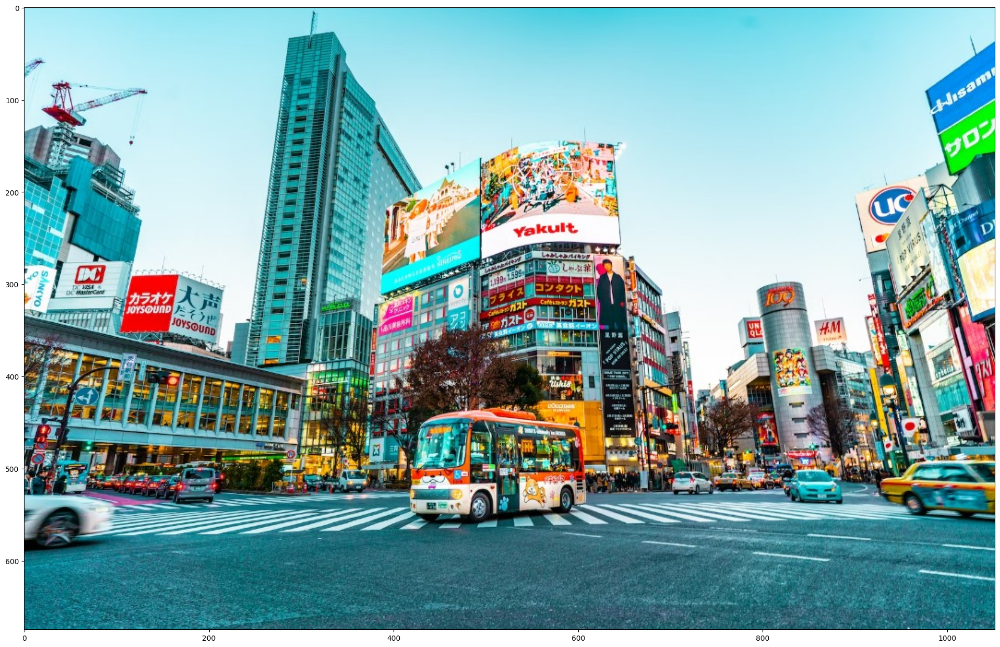

In [ ]:
%matplotlib inline
plt.figure(figsize = (24,32))
plt.imshow(image[0])
plt.show()

In [ ]:
results = model(image)

In [ ]:
classes_indices[8]

{'id': 8, 'name': 'truck'}

In [ ]:
results

{'num_detections': <tf.Tensor: shape=(1,), dtype=float32, numpy=array([100.], dtype=float32)>,
 'detection_classes': <tf.Tensor: shape=(1, 100), dtype=float32, numpy=
 array([[ 6.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  3.,  1.,  3.,  1.,  1.,
          1.,  3., 10.,  3.,  3.,  1., 10., 10.,  1.,  1.,  3.,  1.,  6.,
          8., 10.,  1.,  3., 10., 13.,  8.,  1.,  1.,  1.,  1.,  1., 28.,
         10.,  8.,  1., 10., 10.,  3.,  8.,  8.,  1., 10.,  3.,  3.,  3.,
          6.,  3.,  1.,  6., 10., 10.,  8.,  1., 15., 10., 10.,  3.,  8.,
          1.,  3.,  1., 10., 85.,  8.,  2., 10., 10.,  8.,  8., 10.,  1.,
          1.,  6., 10.,  3.,  8.,  1., 10., 10.,  1.,  8., 16., 10.,  1.,
         15.,  3.,  1.,  3.,  1., 13., 10., 10., 10.]], dtype=float32)>,
 'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
 array([[[6.46941841e-01, 3.96957397e-01, 8.31022799e-01, 5.77762783e-01],
         [7.28239059e-01, 8.79776955e-01, 8.21559370e-01, 9.97979522e-01],
         [7.4409771

In [ ]:
result = {key:value.numpy() for key, value in results.items()}
print(result.keys())

dict_keys(['num_detections', 'detection_classes', 'detection_boxes', 'detection_scores', 'detection_keypoint_scores', 'detection_keypoints'])


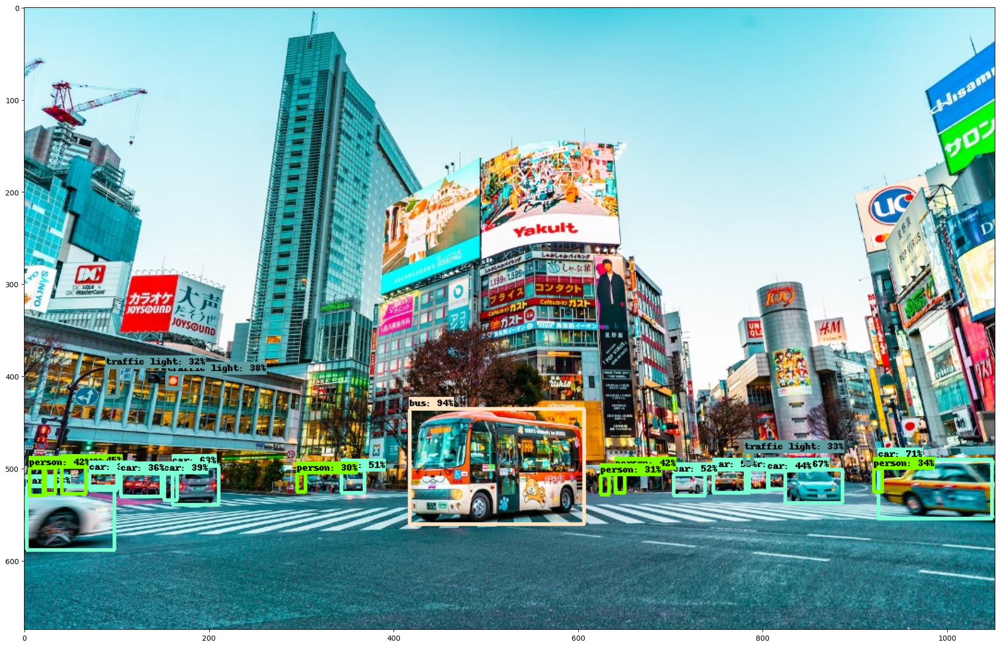

In [ ]:
image_detection = image.copy()
visualization_utils.visualize_boxes_and_labels_on_image_array(
    image_detection[0],
    result['detection_boxes'][0],
    (result['detection_classes'][0]).astype(int),
    result['detection_scores'][0],
    classes_indices,
    max_boxes_to_draw = 200,
    use_normalized_coordinates=True,
    min_score_thresh=.30
)
plt.figure(figsize=(24,32))
plt.imshow(image_detection[0])
plt.show()